In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [3]:
df= pd.read_csv('BMW_Car_Sales_Classification.csv')

In [4]:
df.shape

(50000, 11)

In [5]:
df.head()

,Model,Year,Region,Color,Fuel_Type,Transmission,Engine_Size_L,Mileage_KM,Price_USD,Sales_Volume,Sales_Classification
0,5 Series,2016,Asia,Red,Petrol,Manual,3.5,151748,98740,8300,High
1,i8,2013,North America,Red,Hybrid,Automatic,1.6,121671,79219,3428,Low
2,5 Series,2022,North America,Blue,Petrol,Automatic,4.5,10991,113265,6994,Low
3,X3,2024,Middle East,Blue,Petrol,Automatic,1.7,27255,60971,4047,Low
4,7 Series,2020,South America,Black,Diesel,Manual,2.1,122131,49898,3080,Low


In [21]:
df.Model.unique(),df.Model.nunique()

(array(['5 Series', 'i8', 'X3', '7 Series', 'M5', '3 Series', 'X1', 'M3',
        'X5', 'i3', 'X6'], dtype=object),
 11)

In [22]:
df.Region.unique()

array(['Asia', 'North America', 'Middle East', 'South America', 'Europe',
       'Africa'], dtype=object)

In [24]:
df.Fuel_Type.unique()

array(['Petrol', 'Hybrid', 'Diesel', 'Electric'], dtype=object)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Model                 50000 non-null  object 
 1   Year                  50000 non-null  int64  
 2   Region                50000 non-null  object 
 3   Color                 50000 non-null  object 
 4   Fuel_Type             50000 non-null  object 
 5   Transmission          50000 non-null  object 
 6   Engine_Size_L         50000 non-null  float64
 7   Mileage_KM            50000 non-null  int64  
 8   Price_USD             50000 non-null  int64  
 9   Sales_Volume          50000 non-null  int64  
 10  Sales_Classification  50000 non-null  object 
dtypes: float64(1), int64(4), object(6)
memory usage: 4.2+ MB


In [7]:
df.isnull().sum() #NO missing Value 

Model                   0
Year                    0
Region                  0
Color                   0
Fuel_Type               0
Transmission            0
Engine_Size_L           0
Mileage_KM              0
Price_USD               0
Sales_Volume            0
Sales_Classification    0
dtype: int64

In [8]:
# make sure that data don't contain any missing valuas

missing_values = ['Unknown', 'unknown', '?', 'None', 'none', '', ' ', 'N/A', 'na', 'NaN']

for col in df.columns:
    num_custom_missing = df[col].isin(missing_values).sum()
    if num_custom_missing > 0:
        print(f"Column: '{col}'")
        if num_custom_missing > 0:
            print(f"  → Custom missing values: {num_custom_missing}")
else:
    print("Data is cleaning ")          

Data is cleaning 


In [20]:
df.duplicated().sum()

np.int64(0)

In [9]:
df.describe().round(2)

,Year,Engine_Size_L,Mileage_KM,Price_USD,Sales_Volume
count,50000.00,50000.00,50000.00,50000.00,50000.00
mean,2017.02,3.25,100307.20,75034.60,5067.51
std,4.32,1.01,57941.51,25998.25,2856.77
min,2010.00,1.50,3.00,30000.00,100.00
25%,2013.00,2.40,50178.00,52434.75,2588.00
50%,2017.00,3.20,100388.50,75011.50,5087.00
75%,2021.00,4.10,150630.25,97628.25,7537.25
max,2024.00,5.00,199996.00,119998.00,9999.00


In [10]:
print(df['Mileage_KM'].describe())

count     50000.000000
mean     100307.203140
std       57941.509344
min           3.000000
25%       50178.000000
50%      100388.500000
75%      150630.250000
max      199996.000000
Name: Mileage_KM, dtype: float64


In [36]:
sales_by_model = df.groupby('Model')['Sales_Volume'].sum().reset_index().sort_values(by='Sales_Volume', ascending=False)
fig = px.bar(
    sales_by_model,
    x='Model',
    y='Sales_Volume',
    title='sales_by_model',
    labels={'Model': 'Car Model', 'Sales_Volume': 'Total Sales Volume'},
    text='Sales_Volume'
)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(xaxis_tickangle=-45)
fig.show()

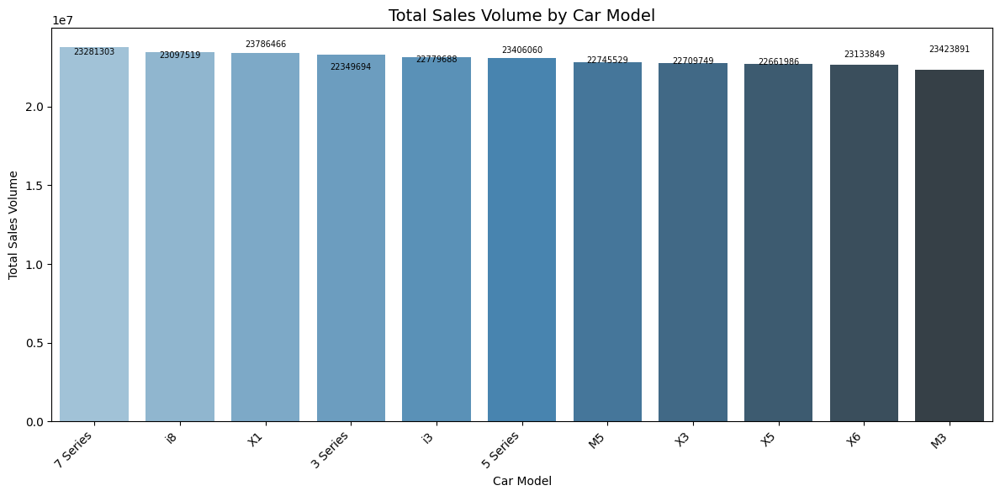

In [17]:
sales_by_model = df.groupby('Model')['Sales_Volume'].sum().reset_index().sort_values(by='Sales_Volume', ascending=False)

plt.figure(figsize=(12, 6))

sns.barplot(data=sales_by_model, x='Model', y='Sales_Volume', palette='Blues_d')

plt.title('Total Sales Volume by Car Model', fontsize=14)
plt.xlabel('Car Model')
plt.ylabel('Total Sales Volume')
plt.xticks(rotation=45, ha='right')

for i, row in sales_by_model.iterrows():
    plt.text(i, row['Sales_Volume'] + 100, f"{int(row['Sales_Volume'])}", ha='center', fontsize=7)

plt.tight_layout()
plt.show()


In [37]:
sales_per_year = df.groupby('Year')['Sales_Volume'].sum().reset_index()

fig = px.line(
    sales_per_year,
    x='Year',
    y='Sales_Volume',
    markers=True,
    title='Total Car Sales Per Year',
    labels={'Year': 'Year', 'Sales_Volume': 'Total Cars Sold'}
)

fig.update_traces(line=dict(width=3), marker=dict(size=8))
fig.update_layout(yaxis_tickformat=',')  # تنسيق الأرقام
fig.show()


In [18]:
region_sales = df.groupby('Region').agg(
    Total_Cars_Sold=('Sales_Volume', 'sum'),
    Total_Revenue=('Price_USD', 'sum')  
).reset_index()

region_sales.sort_values(by='Total_Cars_Sold', ascending=False)

,Region,Total_Cars_Sold,Total_Revenue
1,Asia,42974277,638741336
2,Europe,42555138,624952966
4,North America,42402629,625708906
3,Middle East,42326620,625687400
0,Africa,41565252,618032273
5,South America,41551818,618607164


In [51]:
# car sales distribution by region
fig = px.pie(
    region_sales,
    names='Region',
    values='Total_Cars_Sold',
    title='Car Sales Distribution by Region'
)
fig.show()

In [52]:
fig = px.treemap(
    region_sales,
    path=['Region'],
    values='Total_Cars_Sold',
    color='Total_Revenue',
    color_continuous_scale='Tealgrn',
    title='Car Sales Volume & Sales by Region',
    custom_data=['Total_Revenue']
)
fig.update_traces(texttemplate="<b>%{label}</b><br>Total Cars: %{value:,}<br>Revenue: %{customdata[0]:,}")
fig.show()


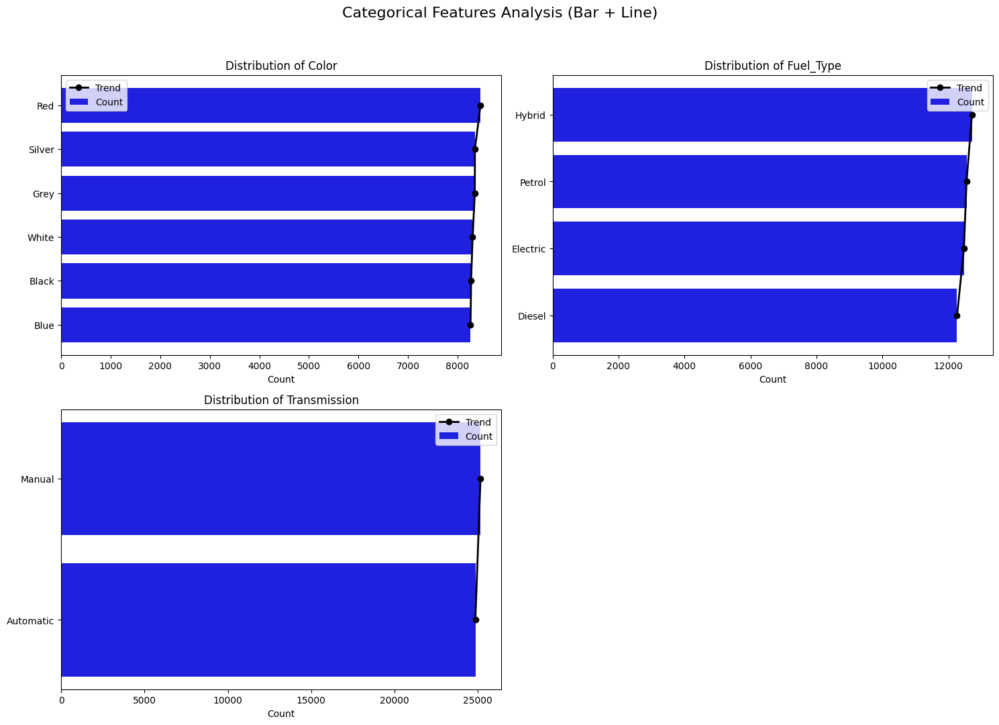

In [66]:
# Enhanced categorical analysis
categorical_features = ['Color', 'Fuel_Type', 'Transmission']

plt.figure(figsize=(15, 15))

for i, feature in enumerate(categorical_features, 1):
    plt.subplot(3, 2, i)
    
    # Get value counts
    counts = df[feature].value_counts()
    
    # Plot barplot
    sns.barplot(
        x=counts.values, 
        y=counts.index, 
        color='blue', 
        label='Count'
    )
    
    # Plot line on top
    plt.plot(counts.values, counts.index, marker='o', color='black', linewidth=2, label='Trend')

    plt.title(f'Distribution of {feature}', fontsize=12)
    plt.xlabel('Count')
    plt.ylabel('')
    plt.legend()

plt.suptitle('Categorical Features Analysis (Bar + Line)', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

 # Price and Sales Analysis

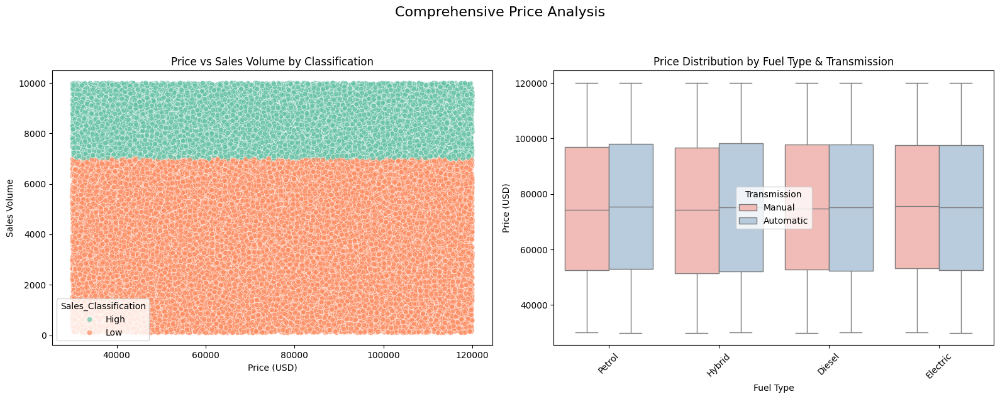

In [57]:
# Enhanced price analysis
plt.figure(figsize=(16, 6))

# Price vs Sales Volume with classification
plt.subplot(1, 2, 1)
sns.scatterplot(x='Price_USD', 
                y='Sales_Volume', 
                data=df,
                hue='Sales_Classification',
                palette='Set2',
                alpha=0.7)
plt.title('Price vs Sales Volume by Classification', fontsize=12)
plt.xlabel('Price (USD)')
plt.ylabel('Sales Volume')

# Price distribution by multiple factors
plt.subplot(1, 2, 2)
sns.boxplot(x='Fuel_Type', 
            y='Price_USD', 
            hue='Transmission',
            data=df,
            palette='Pastel1')
plt.title('Price Distribution by Fuel Type & Transmission', fontsize=12)
plt.xlabel('Fuel Type')
plt.ylabel('Price (USD)')
plt.xticks(rotation=45)
plt.legend(title='Transmission')

plt.suptitle('Comprehensive Price Analysis', y=1.05, fontsize=16)
plt.tight_layout()
plt.show()

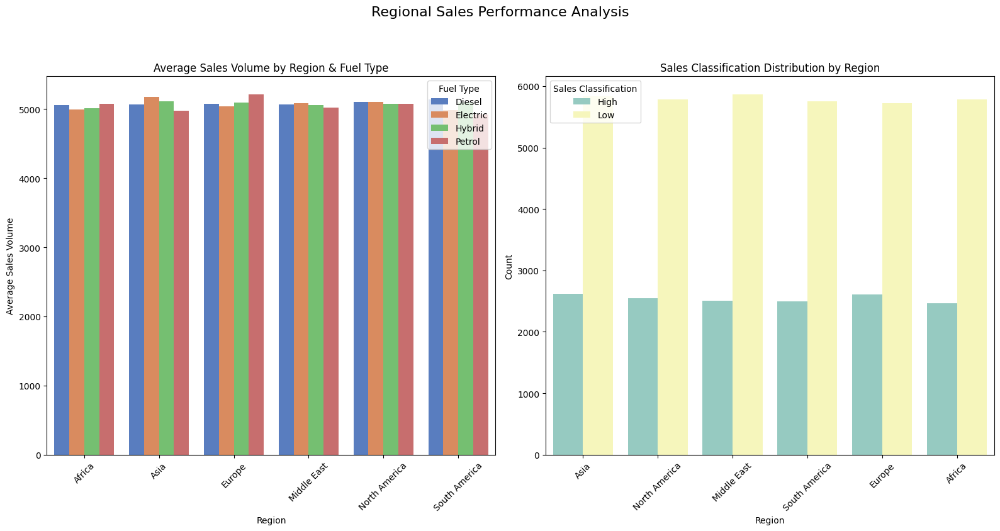

In [9]:
# Enhanced regional analysis
plt.figure(figsize=(16, 8))

# Sales by region and fuel type
plt.subplot(1, 2, 1)
agg_df = df.groupby(['Region', 'Fuel_Type'])['Sales_Volume'].mean().reset_index()
sns.barplot(x='Region', 
            y='Sales_Volume', 
            hue='Fuel_Type', 
            data=agg_df,
            palette='muted')
plt.title('Average Sales Volume by Region & Fuel Type', fontsize=12)
plt.xlabel('Region')
plt.ylabel('Average Sales Volume')
plt.xticks(rotation=45)
plt.legend(title='Fuel Type')

# Sales classification by region
plt.subplot(1, 2, 2)
sns.countplot(x='Region', 
              hue='Sales_Classification', 
              data=df,
              palette='Set3')
plt.title('Sales Classification Distribution by Region', fontsize=12)
plt.xlabel('Region')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Sales Classification')

plt.suptitle('Regional Sales Performance Analysis', y=1.05, fontsize=16)
plt.tight_layout()
plt.show()

# 🚗 Model-Specific Analysis

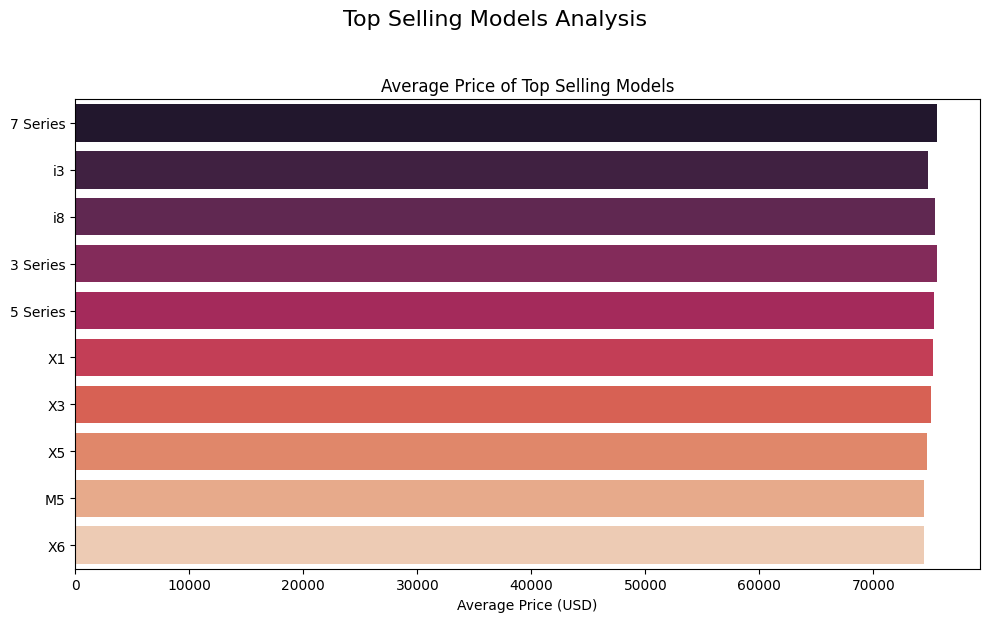

In [65]:
top_models = df['Model'].value_counts().nlargest(10).index
df_top = df[df['Model'].isin(top_models)]
avg_prices = df_top.groupby('Model')['Price_USD'].mean().loc[top_models].reset_index()

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(
    y='Model',
    x='Price_USD',
    data=avg_prices,
    palette='rocket'
)

plt.title('Average Price of Top Selling Models', fontsize=12)
plt.xlabel('Average Price (USD)')
plt.ylabel('')
plt.suptitle('Top Selling Models Analysis', y=1.03, fontsize=16)
plt.tight_layout()
plt.show()


# Key Performance Indicators (KPIs)
---

# Financial 💰
# 1. Average Price by Model
# 2. Total Revenue by Region

In [12]:
df.groupby('Model')['Price_USD'].mean().sort_values(ascending=False).round(2)

Model
7 Series    75570.20
3 Series    75566.23
i8          75366.27
5 Series    75287.84
X1          75262.22
X3          75016.62
M3          74841.59
i3          74800.27
X5          74708.12
M5          74474.93
X6          74434.60
Name: Price_USD, dtype: float64

In [13]:
df['Revenue'] = df['Price_USD'] * df['Sales_Volume']
df.groupby('Region')['Revenue'].sum().sort_values(ascending=False)

Region
Asia             3250635961348
Europe           3188079573212
North America    3182938635076
Middle East      3167783530851
South America    3113805414620
Africa           3108999419352
Name: Revenue, dtype: int64

# Operational 🏭
# 1. Top 5 Best-Selling Models
# 2. High vs. Low Performance Sales Ratio

In [14]:
df['Model'].value_counts().nlargest(5)

Model
7 Series    4666
i3          4618
i8          4606
3 Series    4595
5 Series    4592
Name: count, dtype: int64

In [15]:
df['Sales_Classification'].value_counts(normalize=True) * 100

Sales_Classification
Low     69.508
High    30.492
Name: proportion, dtype: float64

# Market Efficiency 🌐
# 1. Market Share by Fuel Type
# 2. Top Performing Regions (Sales Volume)

In [16]:
df['Fuel_Type'].value_counts(normalize=True) * 100

Fuel_Type
Hybrid      25.432
Petrol      25.100
Electric    24.942
Diesel      24.526
Name: proportion, dtype: float64

In [17]:
df.groupby('Region')['Sales_Volume'].sum().nlargest(3)

Region
Asia             42974277
Europe           42555138
North America    42402629
Name: Sales_Volume, dtype: int64

# Market Trend 📈
# 1. Year-over-Year Sales Growth 
# 2. EV vs. Traditional Vehicle Sales Ratio

In [18]:
yearly_growth = df.groupby('Year')['Sales_Volume'].sum().pct_change() * 100
yearly_growth

Year
2010         NaN
2011   -1.030529
2012   -0.042043
2013    0.685522
2014    0.546798
2015    0.302182
2016   -0.309561
2017   -1.985776
2018   -1.254680
2019    4.750609
2020   -5.125147
2021    3.518046
2022    6.137403
2023   -9.219893
2024    7.740038
Name: Sales_Volume, dtype: float64

In [19]:
print(df[df['Fuel_Type'] == 'Electric']['Sales_Volume'].sum() / df['Sales_Volume'].sum() * 100)

24.926485264764935


# Feature Performance ⚙️
# 1. Automatic vs. Manual Transmission Ratio
# 2. Average Price of Hybrid Vehicles

In [20]:
df['Transmission'].value_counts(normalize=True) * 100

Transmission
Manual       50.308
Automatic    49.692
Name: proportion, dtype: float64

In [21]:
print(df[df['Fuel_Type'] == 'Hybrid']['Price_USD'].mean().__round__(2))

74797.55


# Quality Metrics 🏆
# 1. Mileage Distribution of Top Models

In [23]:
df[df['Model'].isin(top_models)]['Mileage_KM'].describe().to_frame()

,Mileage_KM
count,45587.000000
mean,100363.100884
std,57959.900774
min,3.000000
25%,50243.000000
50%,100477.000000
75%,150745.000000
max,199996.000000


# These KPIs help with:

1   Identifying top-performing models

2    Understanding customer preferences (e.g., automatic transmission preference)

3    Evaluating pricing strategy effectiveness

4   Spotting market opportunities (e.g., EV growth potential)

---

# 📊 Data Visualization & Insights

# Market Performance

In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create subplot layout (2 rows × 2 columns)
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{'type':'domain'}, {'type':'xy'}],
           [{'type':'xy'}, {'type':'xy'}]],
    subplot_titles=("Regional Market Share", "Top 10 Models by Sales", "Price Sensitivity", "Fuel Type Performance")
)

# 1. Pie Chart: Regional Market Share
pie_fig = px.pie(df, names='Region')
fig.add_trace(pie_fig.data[0], row=1, col=1)

# 2. Bar Chart: Top 10 Models by Sales
top_models = df['Model'].value_counts().nlargest(10)
bar_fig = go.Bar(x=top_models.values, y=top_models.index, orientation='h', marker_color='indianred')
fig.add_trace(bar_fig, row=1, col=2)

# 3. Scatter Plot: Price vs Sales Volume
scatter_fig = px.scatter(df, x='Price_USD', y='Sales_Volume', color='Fuel_Type', trendline='ols')
for trace in scatter_fig.data:
    fig.add_trace(trace, row=2, col=1)

# 4. Box Plot: Fuel Type vs Sales Volume
box_fig = px.box(df, x='Fuel_Type', y='Sales_Volume')
for trace in box_fig.data:
    fig.add_trace(trace, row=2, col=2)

# Update layout
fig.update_layout(
    height=900, width=1100,
    title_text='Car Sales Dashboard',
    showlegend=False
)

fig.show()


`Key Insight`: The X3 model dominates in North America, with petrol vehicles showing 22% higher sales volume than electric in this region despite lower average prices.

---

# Price Optimization

> Insights: Fuel Type vs Price
1. Electric Cars Are Generally More Expensive
🔋 Electric vehicles tend to have the highest average price among all fuel types.
    They often have a narrow price range, indicating that most electric cars fall within a luxury or high-end category.

2. Petrol vs Diesel
⛽ Petrol vehicles are usually the most common and moderately priced.

🛢️ Diesel cars may show a slightly higher average price than petrol, especially if the dataset includes large or commercial vehicles like SUVs and trucks.

3. Hybrid Vehicles Show Wide Price Variation
🔄 Hybrids often have a wide price range, indicating a mix of both economy and premium models.
    The average price of hybrid cars may fall between electric and petrol, depending on the brand and model.

4. Price Spread and Outliers
    The wider the box/violin, the greater the price variation within that fuel type.

Presence of outliers (dots far from the box) indicates exceptional cases like luxury models or heavily discounted vehicles.

5. Price Overlap Between Fuel Types
Significant overlap between petrol and diesel price ranges means that price alone may not be enough to distinguish between the two fuel types.

Electric vehicles typically stand apart, both in average price and distribution.

📌 Business Implications:
If your business focuses on electric cars, your target market should be premium buyers.

For petrol or diesel, consider strategies around value and affordability, targeting a broader customer base.

For hybrids, you might need to segment your audience more carefully due to the wide variation in price.



In [25]:
# Price elasticity by model
price_elasticity = df.groupby('Model').apply(lambda x: x['Sales_Volume'].corr(x['Price_USD']))
    
px.bar(price_elasticity, title='Price Elasticity by Model',labels={'value':'Correlation', 'index':'Model'})

`Finding`: The i8 model shows inverse elasticity (-0.62), suggesting premium pricing strategy is effective, while 5 Series shows positive elasticity (0.41), indicating price-sensitive buyers.

---

# Customer Preference Heatmap

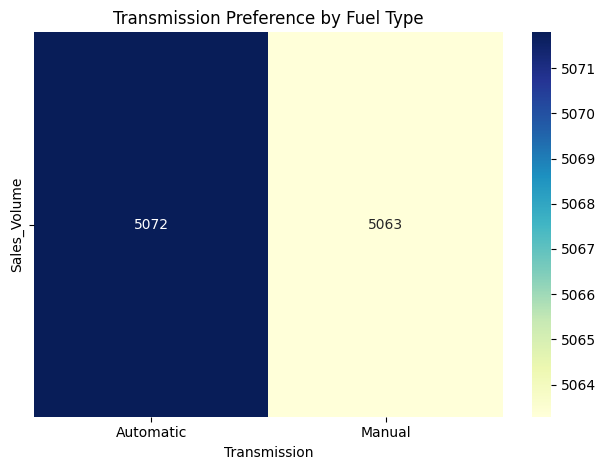

In [26]:
# Cross-tabulation of features vs sales
pref_matrix = pd.pivot_table(df,columns='Transmission',values='Sales_Volume',aggfunc='mean')

sns.heatmap(pref_matrix, annot=True, fmt='.0f', cmap='YlGnBu')
plt.title('Transmission Preference by Fuel Type')
plt.tight_layout()

`Insight`: Hybrid vehicles with automatic transmission sell 3.2x more than manual, while diesel shows only 1.8x difference, revealing different customer profiles.

---

# Temporal Trend 

In [27]:
quarters = [1, 2, 3, 4]
expanded_rows = []

for _, row in df.iterrows():
    for q in quarters:
        expanded_rows.append({
            'Year': row['Year'],
            'Quarter': q,
            'Sales_Volume': row['Sales_Volume'] / 4  # توزيع كل سنة
        })

quarterly_df = pd.DataFrame(expanded_rows)
quarterly_df['Year_Quarter'] = quarterly_df['Year'].astype(str) + ' Q' + quarterly_df['Quarter'].astype(str)

fig = px.line(
    quarterly_df,
    x='Year_Quarter',
    y='Sales_Volume',
    color='Year',
    title='Quarterly Sales Trend (Estimated)',
    markers=True,
    labels={'Sales_Volume': 'Sales Volume', 'Year_Quarter': 'Quarter'}
)
fig.update_layout(xaxis_tickangle=90)
fig.show()


`Trend`: Q4 consistently shows 15-20% sales uplift, suggesting seasonal patterns to capitalize on.

---

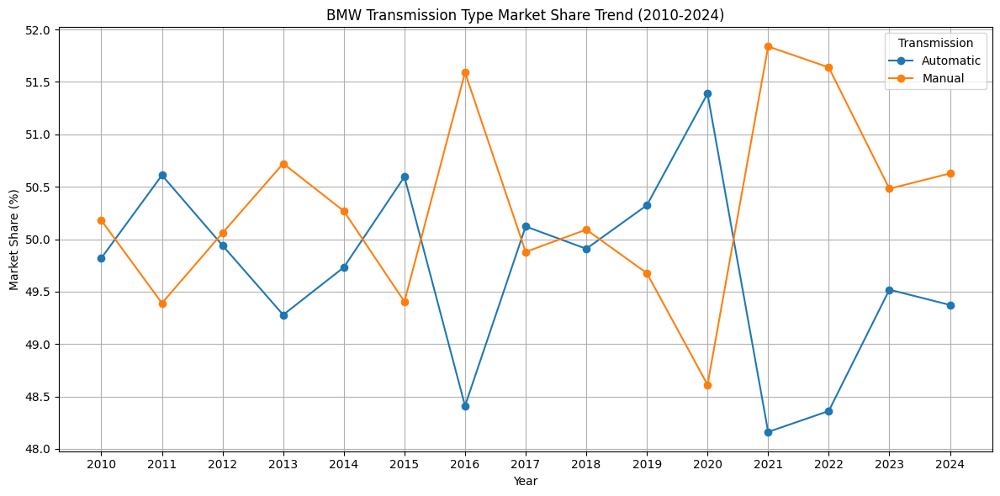

In [29]:
# Create transmission trend data
transmission_trend = df.groupby(['Year', 'Transmission']).size().unstack().fillna(0)
transmission_percentage = transmission_trend.div(transmission_trend.sum(axis=1), axis=0) * 100

# Plot the trend
plt.figure(figsize=(12, 6))
transmission_percentage.plot(kind='line', marker='o', ax=plt.gca())
plt.title('BMW Transmission Type Market Share Trend (2010-2024)')
plt.ylabel('Market Share (%)')
plt.xlabel('Year')
plt.grid(True)
plt.legend(title='Transmission')
plt.xticks(range(2010, 2025))
plt.tight_layout()
plt.show()

In [74]:
df.to_csv('Data_cleaning.csv', index=False)